### base GRN

In [88]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

import seaborn as sns


import os, sys, shutil, importlib, glob
from tqdm.notebook import tqdm

In [89]:
import celloracle as co
co.check_python_requirements()

,package_name,installed_version,required_version,requirement_satisfied
0,numpy,1.24.4,auto,True
1,scipy,1.10.1,auto,True
2,cython,3.0.10,auto,True
3,numba,0.58.1,0.50.1,True
4,matplotlib,3.6.3,auto,True
5,seaborn,0.13.2,auto,True
6,scikit-learn,1.3.2,auto,True
7,h5py,3.11.0,3.1.0,True
8,pandas,1.5.3,1.0.3,True
9,velocyto,0.17.17,0.17,True


In [3]:
from celloracle import motif_analysis as ma
import celloracle as co
co.__version__

'0.18.0'

In [4]:
%config InlineBackend.figure_format = 'retina'

plt.rcParams['figure.figsize'] = [6, 4.5]
plt.rcParams["savefig.dpi"] = 300

In [5]:
# Load scATAC-seq peak list.
peaks = pd.read_csv("/data/User/revolvefire/projects/1.ATAC_230519/240109_ATAC_reintegrate/cicero_output/all_peaks.csv", index_col=0)
peaks = peaks.x.values
peaks

array(['chr1-3094225-3095684', 'chr1-3104906-3105252',
       'chr1-3119514-3120669', ..., 'chrY-1253460-1253887',
       'chrY-2261877-2262107', 'chrY-2340329-2340691'], dtype=object)

In [6]:
# Load Cicero coaccessibility scores.
cicero_connections = pd.read_csv("/data/User/revolvefire/projects/1.ATAC_230519/240109_ATAC_reintegrate/cicero_output/cicero_connections.csv", index_col=0)
cicero_connections.head()

,Peak1,Peak2,coaccess
1,chr1-100006063-100006326,chr1-99760056-99760423,0.0
2,chr1-100006063-100006326,chr1-99771983-99772579,0.0
3,chr1-100006063-100006326,chr1-99774168-99774405,0.0
4,chr1-100006063-100006326,chr1-99843859-99844238,0.0
5,chr1-100006063-100006326,chr1-99868029-99868574,0.0


In [7]:
# Load Cicero coaccessibility scores.
cicero_connections = pd.read_csv("/data/User/revolvefire/projects/1.ATAC_230519/240109_ATAC_reintegrate/cicero_output/cicero_connections.csv", index_col=0)

# Define a function to transform the format
def transform_peak_format(peak):
    parts = peak.split('-')
    return f"{parts[0]}_{parts[1]}_{parts[2]}"

# Apply the function to the Peak1 and Peak2 columns
cicero_connections['Peak1'] = cicero_connections['Peak1'].apply(transform_peak_format)
cicero_connections['Peak2'] = cicero_connections['Peak2'].apply(transform_peak_format)

# Display the transformed DataFrame
cicero_connections.head()

,Peak1,Peak2,coaccess
1,chr1_100006063_100006326,chr1_99760056_99760423,0.0
2,chr1_100006063_100006326,chr1_99771983_99772579,0.0
3,chr1_100006063_100006326,chr1_99774168_99774405,0.0
4,chr1_100006063_100006326,chr1_99843859_99844238,0.0
5,chr1_100006063_100006326,chr1_99868029_99868574,0.0


In [8]:
cicero_connections

,Peak1,Peak2,coaccess
1,chr1_100006063_100006326,chr1_99760056_99760423,0.000000
2,chr1_100006063_100006326,chr1_99771983_99772579,0.000000
3,chr1_100006063_100006326,chr1_99774168_99774405,0.000000
4,chr1_100006063_100006326,chr1_99843859_99844238,0.000000
5,chr1_100006063_100006326,chr1_99868029_99868574,0.000000
...,...,...,...
49003884,chrY_897173_898326,chrY_1046705_1046920,0.000000
49003885,chrY_897173_898326,chrY_1052222_1052489,0.000000
49003886,chrY_897173_898326,chrY_1182429_1183038,-0.002243
49003887,chrY_897173_898326,chrY_1218396_1218869,0.000000


In [ ]:
import pandas as pd

peaks_df = pd.read_csv("/data/User/revolvefire/projects/1.ATAC_230519/240109_ATAC_reintegrate/cicero_output/all_peaks.csv", index_col=0)
peaks = peaks_df.x.values

def transform_peak_format(peak):
    parts = peak.split('-')
    return f"{parts[0]}_{parts[1]}_{parts[2]}"

peaks = [transform_peak_format(peak) for peak in peaks]
peaks = pd.Series(peaks).values
print(peaks)

In [10]:
peaks

array(['chr1_3094225_3095684', 'chr1_3104906_3105252',
       'chr1_3119514_3120669', ..., 'chrY_1253460_1253887',
       'chrY_2261877_2262107', 'chrY_2340329_2340691'], dtype=object)

In [11]:
##!! Please make sure to specify the correct reference genome here
tss_annotated = ma.get_tss_info(peak_str_list=peaks, ref_genome="mm10")

# Check results
tss_annotated.tail()

que bed peaks: 338904
tss peaks in que: 22014


,chr,start,end,gene_short_name,strand
22009,chr5,119199686,119200688,Gm7538,-
22010,chr12,100897730,100899640,Gpr68,-
22011,chr4,129490567,129492026,Fam229a,-
22012,chr17,24473778,24474153,Bricd5,+
22013,chr5,21035588,21036033,Ptpn12,-


In [12]:
integrated = ma.integrate_tss_peak_with_cicero(tss_peak=tss_annotated,
                                               cicero_connections=cicero_connections)
print(integrated.shape)
integrated.head()

(1307875, 3)


,peak_id,gene_short_name,coaccess
0,chr10_100007981_100008291,Kitl,0.052214
1,chr10_100007981_100008291,Tmtc3,0.005769
2,chr10_100009460_100010690,Kitl,0.272718
3,chr10_100009460_100010690,Tmtc3,0.051941
4,chr10_100015140_100017446,Kitl,1.000000


In [13]:
peak = integrated[integrated.coaccess >= 0.8]
peak = peak[["peak_id", "gene_short_name"]].reset_index(drop=True)

In [14]:
print(peak.shape)
peak.head()


(20790, 2)


,peak_id,gene_short_name
0,chr10_100015140_100017446,Kitl
1,chr10_100486478_100488237,Tmtc3
2,chr10_100588189_100589448,4930430F08Rik
3,chr10_100740444_100741633,Gm35722
4,chr10_100741862_100742391,Gm35722


In [15]:
peak.to_csv("processed_peak_file.csv")

In [16]:
# PLEASE make sure reference genome is correct.
ref_genome = "mm10"

genome_installation = ma.is_genome_installed(ref_genome=ref_genome,
                                             genomes_dir=None)
print(ref_genome, "installation: ", genome_installation)

mm10 installation:  True


In [17]:
import genomepy

In [18]:
genomepy.install_genome(name="mm10", provider="UCSC")

15:46:45 | INFO | Downloading assembly summaries from UCSC
15:46:51 | INFO | Downloading genome from UCSC. Target URL: https://hgdownload.soe.ucsc.edu/goldenPath/mm10/bigZips/chromFa.tar.gz...


Download:   0%|          | 0.00/830M [00:00<?, ?B/s]

15:51:03 | INFO | Genome download successful, starting post processing...
15:51:26 | INFO | name: mm10
15:51:26 | INFO | local name: mm10
15:51:26 | INFO | fasta: /mnt/gmi-l1/_90.User_Data/revolvefire/.local/share/genomes/mm10/mm10.fa


Filtering Fasta: 0.00 lines [00:00, ? lines/s]

Fasta("/mnt/gmi-l1/_90.User_Data/revolvefire/.local/share/genomes/mm10/mm10.fa")

In [19]:
genome_installation = ma.is_genome_installed(ref_genome=ref_genome,
                                             genomes_dir=None)
print(ref_genome, "installation: ", genome_installation)

mm10 installation:  True


In [17]:
peaks = pd.read_csv("processed_peak_file.csv", index_col=0)
peaks.head()

,peak_id,gene_short_name
0,chr10_100015140_100017446,Kitl
1,chr10_100486478_100488237,Tmtc3
2,chr10_100588189_100589448,4930430F08Rik
3,chr10_100740444_100741633,Gm35722
4,chr10_100741862_100742391,Gm35722


In [18]:
peaks = ma.check_peak_format(peaks, ref_genome, genomes_dir=None)

Peaks before filtering:  20790
Peaks with invalid chr_name:  0
Peaks with invalid length:  0
Peaks after filtering:  20790


In [19]:
# Instantiate TFinfo object
tfi = ma.TFinfo(peak_data_frame=peaks,
                ref_genome=ref_genome,
                genomes_dir=None)

In [20]:
%%time
# Scan motifs. !!CAUTION!! This step may take several hours if you have many peaks!
tfi.scan(fpr=0.02,
         motifs=None,  # If you enter None, default motifs will be loaded.
         verbose=True)

# Save tfinfo object
tfi.to_hdf5(file_path="test1.celloracle.tfinfo")


No motif data entered. Loading default motifs for your species ...
 Default motif for vertebrate: gimme.vertebrate.v5.0. 
 For more information, please see https://gimmemotifs.readthedocs.io/en/master/overview.html 

Initiating scanner... 



2024-07-10 17:49:31,161 - DEBUG - using background: genome mm10 with size 200


Calculating FPR-based threshold. This step may take substantial time when you load a new ref-genome. It will be done quicker on the second time. 



2024-07-10 17:49:33,457 - DEBUG - determining FPR-based threshold


Motif scan started .. It may take long time.



Scanning:   0%|          | 0/18933 [00:00<?, ? sequences/s]

CPU times: user 24min 33s, sys: 45 s, total: 25min 18s
Wall time: 25min 19s


In [21]:
# Check motif scan results
tfi.scanned_df.head()

,seqname,motif_id,factors_direct,factors_indirect,score,pos,strand
0,chr10_100015140_100017446,GM.5.0.Homeodomain.0001,TGIF1,"ENSG00000234254, TGIF1",10.311002,1154,1
1,chr10_100015140_100017446,GM.5.0.Mixed.0001,,"EGR1, SRF",7.925873,632,1
2,chr10_100015140_100017446,GM.5.0.Mixed.0001,,"EGR1, SRF",7.321375,1062,-1
3,chr10_100015140_100017446,GM.5.0.Mixed.0001,,"EGR1, SRF",7.276585,962,-1
4,chr10_100015140_100017446,GM.5.0.Nuclear_receptor.0002,NR2C2,"NR2C2, Nr2c2",9.067331,600,-1


In [22]:
# Reset filtering
tfi.reset_filtering()

# Do filtering
tfi.filter_motifs_by_score(threshold=10)

# Format post-filtering results.
tfi.make_TFinfo_dataframe_and_dictionary(verbose=True)

Filtering finished: 14335671 -> 2899048
1. Converting scanned results into one-hot encoded dataframe.


  0%|          | 0/18933 [00:00<?, ?it/s]

2. Converting results into dictionaries.


  0%|          | 0/17919 [00:00<?, ?it/s]

  0%|          | 0/1090 [00:00<?, ?it/s]

In [23]:
df = tfi.to_dataframe()
df.head()


,peak_id,gene_short_name,9430076c15rik,Ac002126.6,Ac012531.1,Ac226150.2,Afp,Ahr,Ahrr,Aire,...,Znf784,Znf8,Znf816,Znf85,Zscan10,Zscan16,Zscan22,Zscan26,Zscan31,Zscan4
0,chr10_100015140_100017446,Kitl,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,1,0
1,chr10_100486478_100488237,Tmtc3,0,0,0,0,0,0,0,0,...,1,0,0,0,0,0,1,0,0,0
2,chr10_100588189_100589448,4930430F08Rik,0,0,0,0,0,1,1,0,...,0,0,0,0,0,0,0,0,0,0
3,chr10_100740444_100741633,Gm35722,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,chr10_100741862_100742391,Gm35722,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [24]:
# Save result as a dataframe
df = tfi.to_dataframe()
df.to_parquet("base_GRN_dataframe.parquet")

### perturbation

In [1]:
# 0. Import

import os
import sys

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import scanpy as sc
import seaborn as sns


In [2]:
import celloracle as co
co.__version__

/mnt/gmi-l1/_90.User_Data/revolvefire/miniforge3/envs/celloracle_3/lib/python3.8/site-packages/loompy/bus_file.py:68: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  def twobit_to_dna(twobit: int, size: int) -> str:
/mnt/gmi-l1/_90.User_Data/revolvefire/miniforge3/envs/celloracle_3/lib/python3.8/site-packages/loompy/bus_file.py:85: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit f

'0.18.0'

In [3]:
import matplotlib.pyplot as plt
%matplotlib inline


import os, sys, shutil, importlib, glob
from tqdm.notebook import tqdm

In [4]:
%config InlineBackend.figure_format = 'retina'

plt.rcParams['figure.figsize'] = [6, 4.5]
plt.rcParams["savefig.dpi"] = 300

In [5]:
from time import gmtime, strftime
strftime("%Y-%m-%d %H:%M:%S", gmtime())

'2025-02-19 05:33:21'

In [6]:
mainDir = "/mnt/gmi-l1/_90.User_Data/revolvefire/FASTQ"

In [7]:
objectDir = "/data/User/revolvefire/projects/1.ATAC_230519/230808_scRNA_new/scobject/"

In [14]:
adata = sc.read(objectDir + "241030.adata.integrated.hvg3000.LABELED_fixed.h5ad")

Only considering the two last: ['.LABELED_fixed', '.h5ad'].
Only considering the two last: ['.LABELED_fixed', '.h5ad'].


In [15]:
adata

AnnData object with n_obs × n_vars = 67558 × 3000
    obs: 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'outlier', 'mt_outlier', 'scDblFinder_score', 'scDblFinder_class', 'orig.ident', 'bulk.ident', 'batch', 'bulk_ident', 'orig_ident', '_scvi_batch', '_scvi_labels', 'leiden_scVI_0.2', 'leiden_scVI_0.3', 'leiden_scVI_0.4', 'leiden_scVI_0.5', 'leiden_scVI_0.6', 'leiden_scVI_0.7', 'leiden_scVI_0.8', 'leiden_scVI_0.9', 'leiden_scVI_1.0', 'leiden_scVI_1.5', 'sub_cluster', 'cell_type', '_scvi_raw_norm_scaling', 'label'
    var: 'gene_ids', 'feature_types', 'genome', 'mt', 'ribo', 'hb', 'n_cells_by_counts-0', 'mean_counts-0', 'log1p_mean_counts-0', 'pct_dropout_by_counts-0', 'total_counts-0', 'log1p_total_counts-0', 'n_cells-0', 'n_cells

In [16]:
sc.set_figure_params(scanpy=True, dpi=300, dpi_save=300)

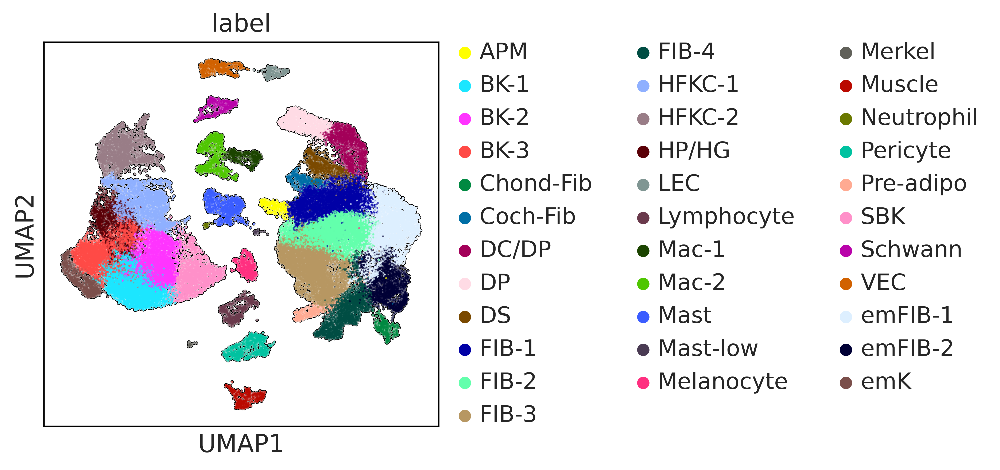

In [17]:
sc.pl.umap(adata, color='label', add_outline=True, size=5, )

In [ ]:
import pandas as pd
desired_order = [
    'APM', 'BK-1', 'BK-2', 'BK-3', 'Chond-Fib', 'Coch-Fib', 'DC/DP', 'DP', 'DS',
    'FIB-1', 'FIB-2', 'FIB-3', 'FIB-4', 'HFKC-1', 'HFKC-2', 'HP/HG', 'LEC', 'Lymphocyte',
    'Mac-1', 'Mac-2', 'Mast', 'Mast-low', 'Melanocyte', 'Merkel', 'Muscle', 'Neutrophil',
    'Pericyte', 'Pre-adipo', 'SBK', 'Schwann', 'VEC', 'emFIB-1', 'emFIB-2', 'emK'
]
custom_palette = [
    '#ff4a46', '#1ce6ff', '#ffdbe5', '#ffff00', '#008941', '#006fa6', '#a30059',
    '#ff34ff', '#7a4900', '#0000a6', '#63ffac', '#b79762', '#004d43', '#161673',
    '#997d87', '#5a0007', '#809693', '#6a3a4c', '#1b4400', '#4fc601', '#3b5dff',
    '#4a3b53', '#ff2f80', '#adad18', '#ba0900', '#6b7900', '#00c2a0', '#ffaa92',
    '#466b8c', '#b903aa', '#d16100', '#8fb0ff', '#ff90c9', '#7b4f4b'
]

adata.obs['label'] = adata.obs['label'].astype('category')
adata.obs['label'] = adata.obs['label'].cat.set_categories(desired_order, ordered=True)
adata.uns['label_colors'] = custom_palette

print("Label categories:", adata.obs['label'].cat.categories)
print("Assigned color palette:", adata.uns['label_colors'])

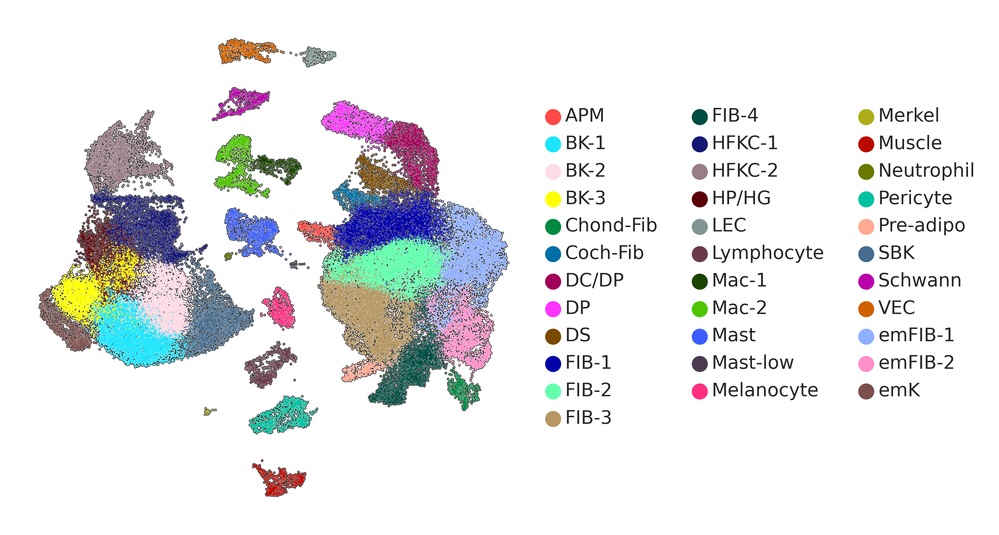

In [41]:
sc.pl.umap(adata, color='label', add_outline=True, frameon=False, title="", legend_fontsize="xx-small", save="250219.scRNA.UMAP.newcolor.svg")

In [144]:
sc.set_figure_params(scanpy=True, dpi=300, dpi_save=300, fontsize=5)

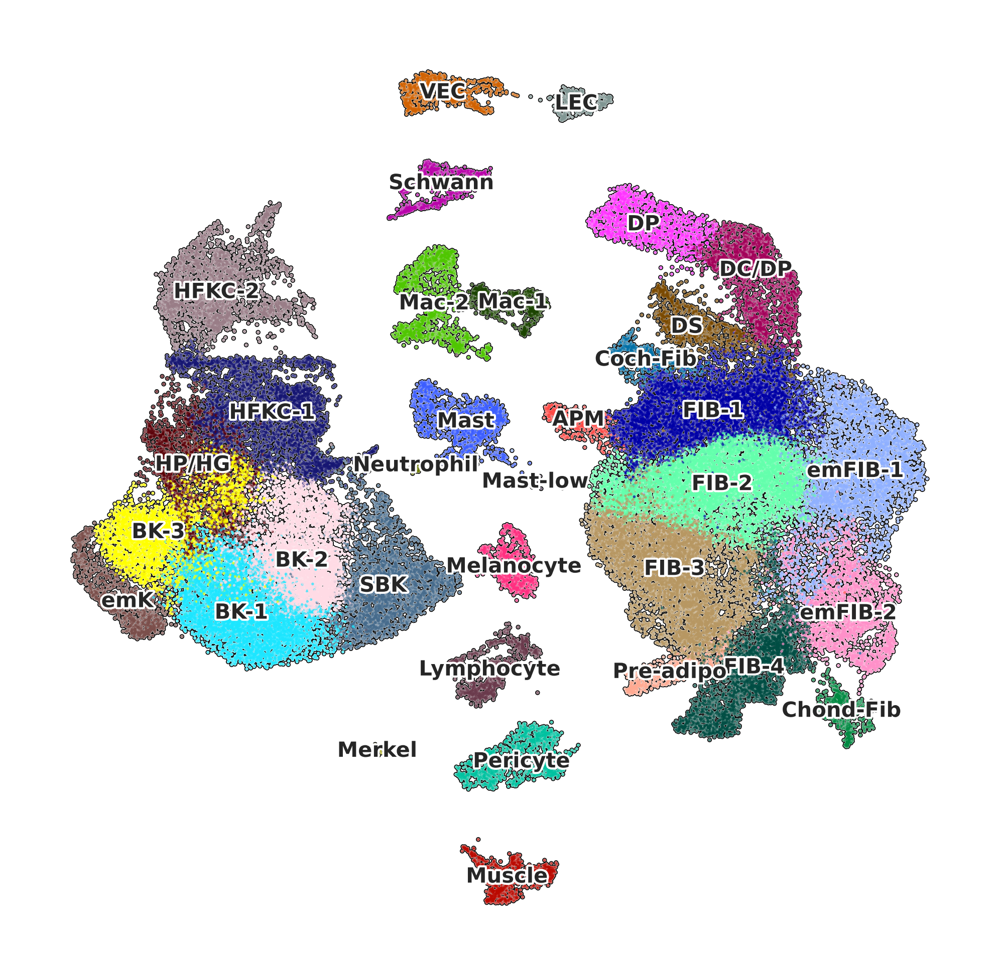

In [145]:
sc.pl.umap(adata, color='label', add_outline=True, frameon=False, title="", legend_fontoutline=1, legend_loc="on data", save="250219.scRNA.UMAP.legend_on_data.newcolor.svg")

In [ ]:
#adata.write(objectDir + "250219.adata.integrated.hvg3000.LABELED_fixed.nocolor_label.h5ad")

In [135]:
adata = sc.read(objectDir + "250219.adata.integrated.hvg3000.LABELED_fixed.nocolor_label.h5ad")

Only considering the two last: ['.nocolor_label', '.h5ad'].
Only considering the two last: ['.nocolor_label', '.h5ad'].


In [62]:
cell_of_interest = adata.obs.index[adata.obs.label.isin(["DP", "DC/DP", "DS", "Coch-Fib", "APM", "FIB-1", "FIB-2", "FIB-3", "emFIB-1", "emFIB-2", "Chond-Fib", "FIB-4", "Pre-adipo"])]
adata = adata[cell_of_interest]

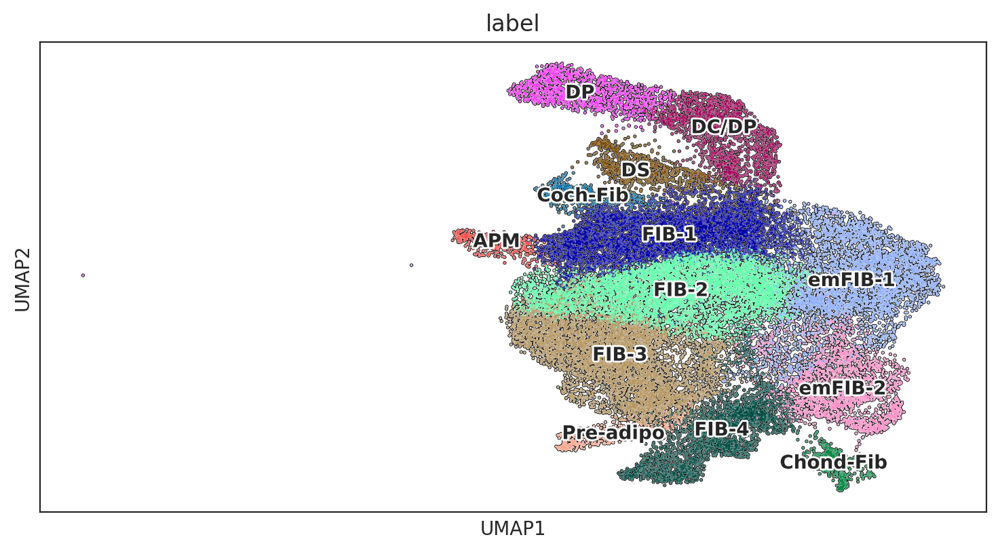

In [63]:
sc.pl.umap(adata, color='label', add_outline=True, size=5, legend_loc='on data',legend_fontoutline=2)

In [64]:
adata

View of AnnData object with n_obs × n_vars = 34103 × 3000
    obs: 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'outlier', 'mt_outlier', 'scDblFinder_score', 'scDblFinder_class', 'orig.ident', 'bulk.ident', 'batch', 'bulk_ident', 'orig_ident', '_scvi_batch', '_scvi_labels', 'leiden_scVI_0.2', 'leiden_scVI_0.3', 'leiden_scVI_0.4', 'leiden_scVI_0.5', 'leiden_scVI_0.6', 'leiden_scVI_0.7', 'leiden_scVI_0.8', 'leiden_scVI_0.9', 'leiden_scVI_1.0', 'leiden_scVI_1.5', 'sub_cluster', 'cell_type', '_scvi_raw_norm_scaling', 'label'
    var: 'gene_ids', 'feature_types', 'genome', 'mt', 'ribo', 'hb', 'n_cells_by_counts-0', 'mean_counts-0', 'log1p_mean_counts-0', 'pct_dropout_by_counts-0', 'total_counts-0', 'log1p_total_counts-0', 'n_cells-0', 

In [65]:
# Update the category order of 'label'
new_order = ['APM','Chond-Fib', 'Coch-Fib', 'DC/DP', 'DP', 'DS', 'FIB-1', 'FIB-2', 'FIB-3', 'FIB-4', 
             'Pre-adipo',  'emFIB-1', 'emFIB-2']

adata.obs['label'] = adata.obs['label'].astype('category')
adata.obs['label'].cat.reorder_categories(new_order, inplace=True)

/tmp/ipykernel_29081/4253211851.py:6: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Reordering categories will always return a new Categorical object.
  adata.obs['label'].cat.reorder_categories(new_order, inplace=True)


In [67]:
sc.tl.draw_graph(adata, init_pos='X_umap', random_state=0)

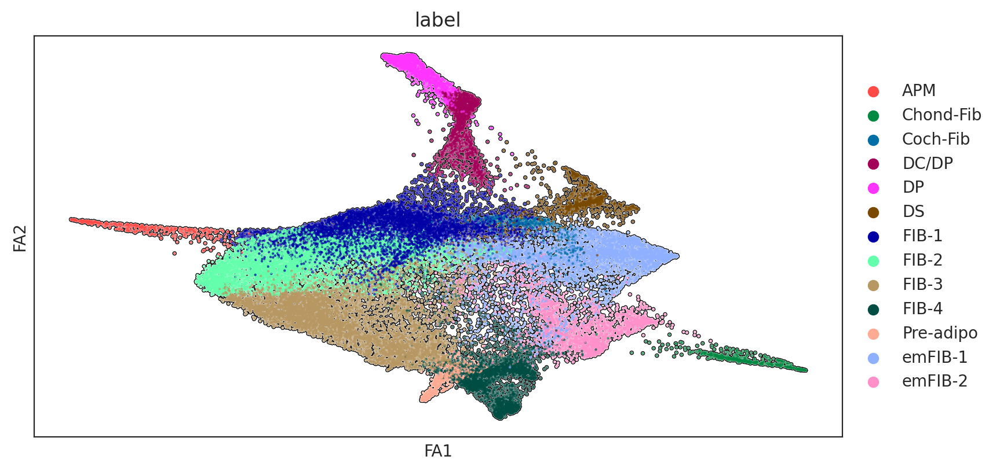

In [68]:
sc.pl.draw_graph(adata, color='label', size=10, add_outline=True, frameon=True, save="250217.dermislabel.svg")

In [69]:
base_GRN = pd.read_parquet("base_GRN_dataframe.parquet")

base_GRN.head()

,peak_id,gene_short_name,9430076c15rik,Ac002126.6,Ac012531.1,Ac226150.2,Afp,Ahr,Ahrr,Aire,...,Znf784,Znf8,Znf816,Znf85,Zscan10,Zscan16,Zscan22,Zscan26,Zscan31,Zscan4
0,chr10_100015140_100017446,Kitl,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,1,0
1,chr10_100486478_100488237,Tmtc3,0,0,0,0,0,0,0,0,...,1,0,0,0,0,0,1,0,0,0
2,chr10_100588189_100589448,4930430F08Rik,0,0,0,0,0,1,1,0,...,0,0,0,0,0,0,0,0,0,0
3,chr10_100740444_100741633,Gm35722,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,chr10_100741862_100742391,Gm35722,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [70]:
# Instantiate Oracle object
oracle = co.Oracle()

In [71]:
# Check data in anndata
print("Metadata columns :", list(adata.obs.columns))
print("Dimensional reduction: ", list(adata.obsm.keys()))

Metadata columns : ['n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'outlier', 'mt_outlier', 'scDblFinder_score', 'scDblFinder_class', 'orig.ident', 'bulk.ident', 'batch', 'bulk_ident', 'orig_ident', '_scvi_batch', '_scvi_labels', 'leiden_scVI_0.2', 'leiden_scVI_0.3', 'leiden_scVI_0.4', 'leiden_scVI_0.5', 'leiden_scVI_0.6', 'leiden_scVI_0.7', 'leiden_scVI_0.8', 'leiden_scVI_0.9', 'leiden_scVI_1.0', 'leiden_scVI_1.5', 'sub_cluster', 'cell_type', '_scvi_raw_norm_scaling', 'label']
Dimensional reduction:  ['X_scVI', 'X_umap', '_scvi_extra_categorical_covs', '_scvi_extra_continuous_covs', 'X_draw_graph_fa']


In [72]:
adata

AnnData object with n_obs × n_vars = 34103 × 3000
    obs: 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'outlier', 'mt_outlier', 'scDblFinder_score', 'scDblFinder_class', 'orig.ident', 'bulk.ident', 'batch', 'bulk_ident', 'orig_ident', '_scvi_batch', '_scvi_labels', 'leiden_scVI_0.2', 'leiden_scVI_0.3', 'leiden_scVI_0.4', 'leiden_scVI_0.5', 'leiden_scVI_0.6', 'leiden_scVI_0.7', 'leiden_scVI_0.8', 'leiden_scVI_0.9', 'leiden_scVI_1.0', 'leiden_scVI_1.5', 'sub_cluster', 'cell_type', '_scvi_raw_norm_scaling', 'label'
    var: 'gene_ids', 'feature_types', 'genome', 'mt', 'ribo', 'hb', 'n_cells_by_counts-0', 'mean_counts-0', 'log1p_mean_counts-0', 'pct_dropout_by_counts-0', 'total_counts-0', 'log1p_total_counts-0', 'n_cells-0', 'n_cells

In [73]:
print(adata.X)

  (0, 10)	0.949934335797626
  (0, 24)	0.949934335797626
  (0, 25)	0.5837618752715938
  (0, 31)	0.5837618752715938
  (0, 38)	2.42533437163781
  (0, 39)	1.2173755295417152
  (0, 45)	0.949934335797626
  (0, 46)	0.949934335797626
  (0, 47)	0.949934335797626
  (0, 48)	1.2173755295417152
  (0, 49)	0.5837618752715938
  (0, 56)	0.949934335797626
  (0, 68)	0.5837618752715938
  (0, 70)	0.5837618752715938
  (0, 71)	0.5837618752715938
  (0, 81)	0.949934335797626
  (0, 92)	1.9936330098879023
  (0, 93)	4.153066592748469
  (0, 98)	0.5837618752715938
  (0, 100)	0.5837618752715938
  (0, 101)	2.0961670674281647
  (0, 115)	1.2173755295417152
  (0, 139)	0.949934335797626
  (0, 150)	0.949934335797626
  (0, 151)	0.5837618752715938
  :	:
  (34102, 2758)	2.6150462864337456
  (34102, 2759)	0.8183624838847489
  (34102, 2768)	1.2623086346958474
  (34102, 2778)	1.2623086346958474
  (34102, 2784)	0.8183624838847489
  (34102, 2796)	0.8183624838847489
  (34102, 2804)	1.568689810969515
  (34102, 2808)	5.3710409612980

In [74]:
adata.X = adata.layers["counts"].copy()

In [75]:
print(adata.X)

  (0, 10)	2.0
  (0, 24)	2.0
  (0, 25)	1.0
  (0, 31)	1.0
  (0, 38)	13.0
  (0, 39)	3.0
  (0, 45)	2.0
  (0, 46)	2.0
  (0, 47)	2.0
  (0, 48)	3.0
  (0, 49)	1.0
  (0, 56)	2.0
  (0, 68)	1.0
  (0, 70)	1.0
  (0, 71)	1.0
  (0, 81)	2.0
  (0, 92)	8.0
  (0, 93)	79.0
  (0, 98)	1.0
  (0, 100)	1.0
  (0, 101)	9.0
  (0, 115)	3.0
  (0, 139)	2.0
  (0, 150)	2.0
  (0, 151)	1.0
  :	:
  (34102, 2758)	10.0
  (34102, 2759)	1.0
  (34102, 2768)	2.0
  (34102, 2778)	2.0
  (34102, 2784)	1.0
  (34102, 2796)	1.0
  (34102, 2804)	3.0
  (34102, 2808)	169.0
  (34102, 2812)	2.0
  (34102, 2843)	2.0
  (34102, 2847)	1.0
  (34102, 2849)	5.0
  (34102, 2855)	2.0
  (34102, 2856)	3.0
  (34102, 2907)	1.0
  (34102, 2919)	2.0
  (34102, 2923)	1.0
  (34102, 2933)	40.0
  (34102, 2936)	3.0
  (34102, 2951)	11.0
  (34102, 2962)	2.0
  (34102, 2978)	3.0
  (34102, 2980)	1.0
  (34102, 2984)	2.0
  (34102, 2996)	7.0


In [76]:
# Instantiate Oracle object.
oracle.import_anndata_as_raw_count(adata=adata,
                                   cluster_column_name="label",
                                   embedding_name="X_draw_graph_fa") ### fa graph로 바꿨고

In [77]:
adata.X.max()

1565.0

In [78]:
# You can load TF info dataframe with the following code.
oracle.import_TF_data(TF_info_matrix=base_GRN)

# Alternatively, if you saved the informmation as a dictionary, you can use the code below.
# oracle.import_TF_data(TFdict=TFinfo_dictionary)

In [79]:
# Perform PCA
oracle.perform_PCA()


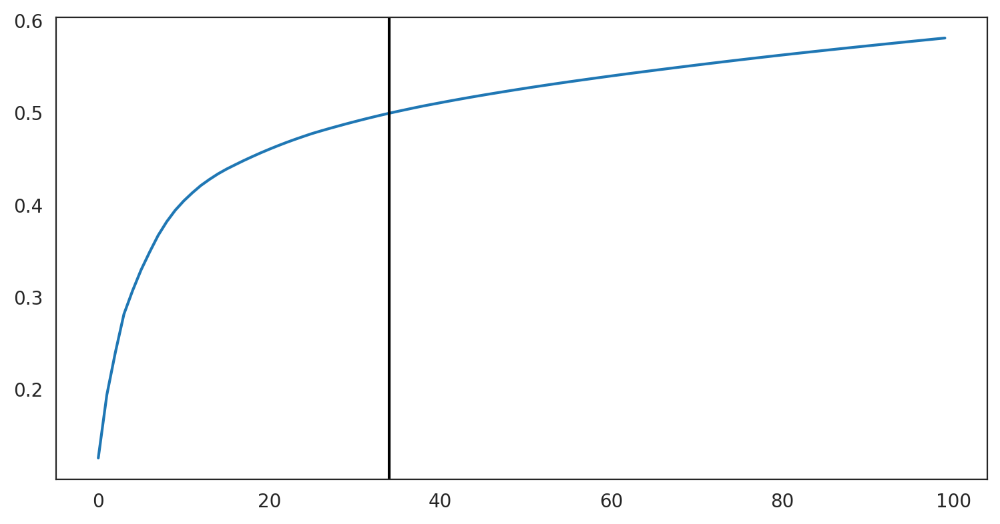

34


In [80]:
# Select important PCs
plt.plot(np.cumsum(oracle.pca.explained_variance_ratio_)[:100])
n_comps = np.where(np.diff(np.diff(np.cumsum(oracle.pca.explained_variance_ratio_))>0.002))[0][0]
plt.axvline(n_comps, c="k")
plt.show()
print(n_comps)
n_comps = min(n_comps, 50)

In [81]:
n_cell = oracle.adata.shape[0]
print(f"cell number is :{n_cell}")

cell number is :34103


In [82]:
k = int(0.025*n_cell)
print(f"Auto-selected k is :{k}")

Auto-selected k is :852


In [83]:
oracle.knn_imputation(n_pca_dims=n_comps, k=k, balanced=True, b_sight=k*8,
                      b_maxl=k*4, n_jobs=4)

In [84]:
%%time

# Calculate GRN for each population in "louvain_annot" clustering unit.
# This step may take some time.(~30 minutes)
links = oracle.get_links(cluster_name_for_GRN_unit="label", alpha=10,
                         verbose_level=10)

  0%|          | 0/13 [00:00<?, ?it/s]

Inferring GRN for APM...


  0%|          | 0/2599 [00:00<?, ?it/s]

Inferring GRN for Chond-Fib...


  0%|          | 0/2599 [00:00<?, ?it/s]

Inferring GRN for Coch-Fib...


  0%|          | 0/2599 [00:00<?, ?it/s]

Inferring GRN for DC/DP...


  0%|          | 0/2599 [00:00<?, ?it/s]

Inferring GRN for DP...


  0%|          | 0/2599 [00:00<?, ?it/s]

Inferring GRN for DS...


  0%|          | 0/2599 [00:00<?, ?it/s]

Inferring GRN for FIB-1...


  0%|          | 0/2599 [00:00<?, ?it/s]

Inferring GRN for FIB-2...


  0%|          | 0/2599 [00:00<?, ?it/s]

Inferring GRN for FIB-3...


  0%|          | 0/2599 [00:00<?, ?it/s]

Inferring GRN for FIB-4...


  0%|          | 0/2599 [00:00<?, ?it/s]

Inferring GRN for Pre-adipo...


  0%|          | 0/2599 [00:00<?, ?it/s]

Inferring GRN for emFIB-1...


  0%|          | 0/2599 [00:00<?, ?it/s]

Inferring GRN for emFIB-2...


  0%|          | 0/2599 [00:00<?, ?it/s]

CPU times: user 31min 58s, sys: 2min 15s, total: 34min 14s
Wall time: 48min 7s


In [85]:
# Save oracle object.
oracle.to_hdf5("250219.ourgrn.fibroblast.celloracle.oracle")

In [86]:
links.to_hdf5(file_path="250219.ourATACgrn.fibroblast.raw.links.celloracle.links")

In [87]:
# You can load files with the following command.
links = co.load_hdf5(file_path="250219.ourATACgrn.fibroblast.raw.links.celloracle.links")

In [88]:
oracle = co.load_hdf5("250219.ourgrn.fibroblast.celloracle.oracle")

In [89]:
links.filter_links(p=0.001, weight="coef_abs", threshold_number=2000)

In [90]:
plt.rcParams["figure.figsize"] = [9, 4.5]

APM


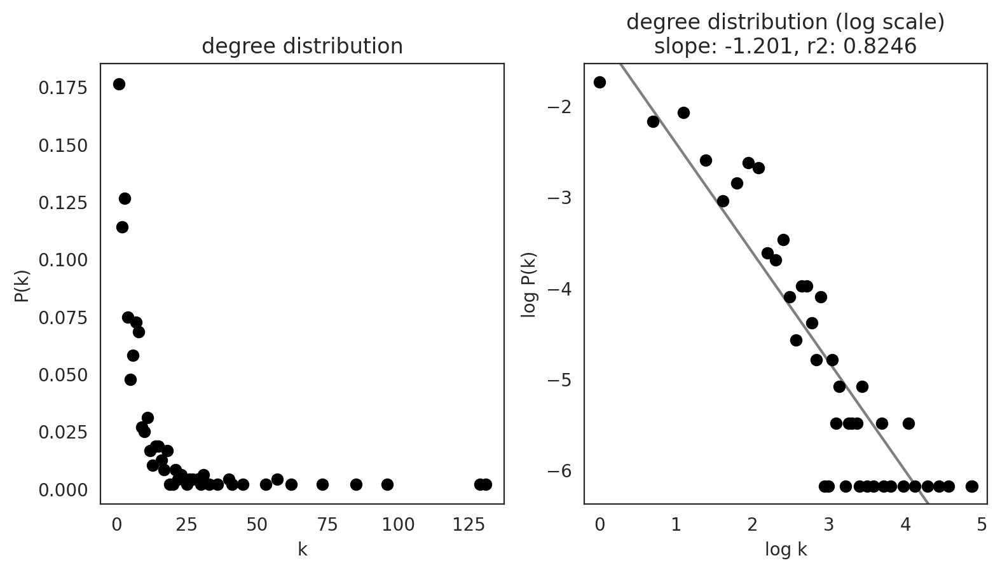

Chond-Fib


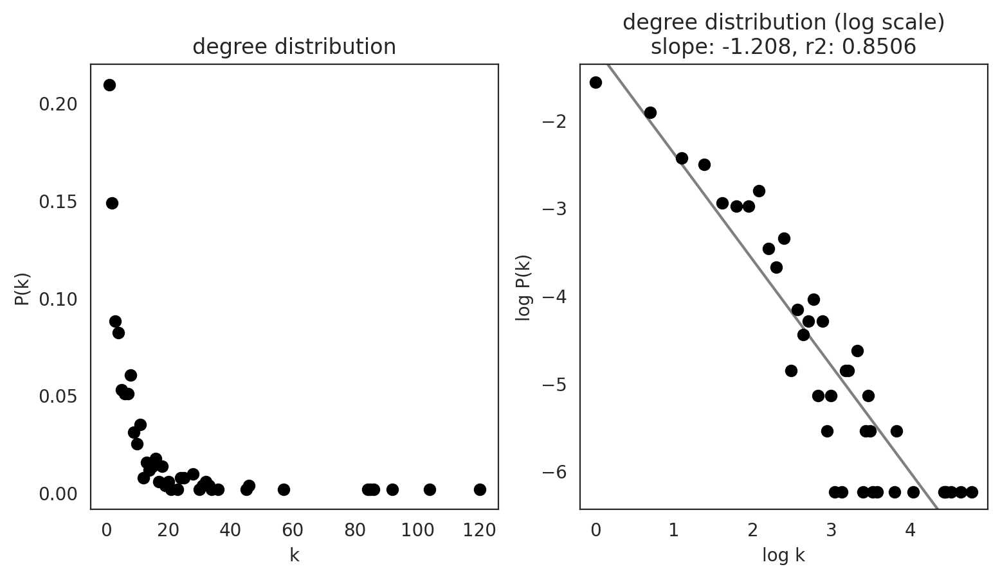

Coch-Fib


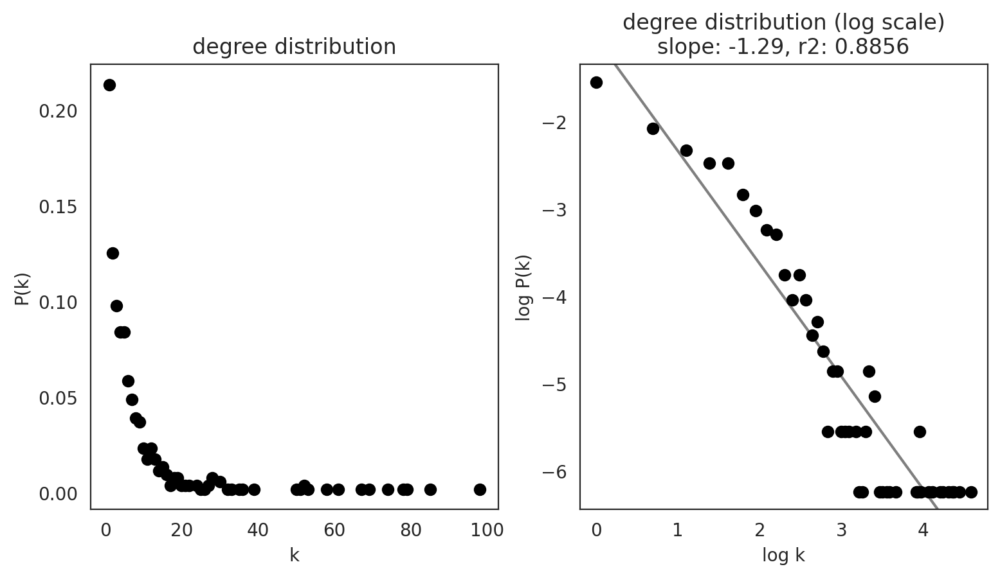

DC/DP


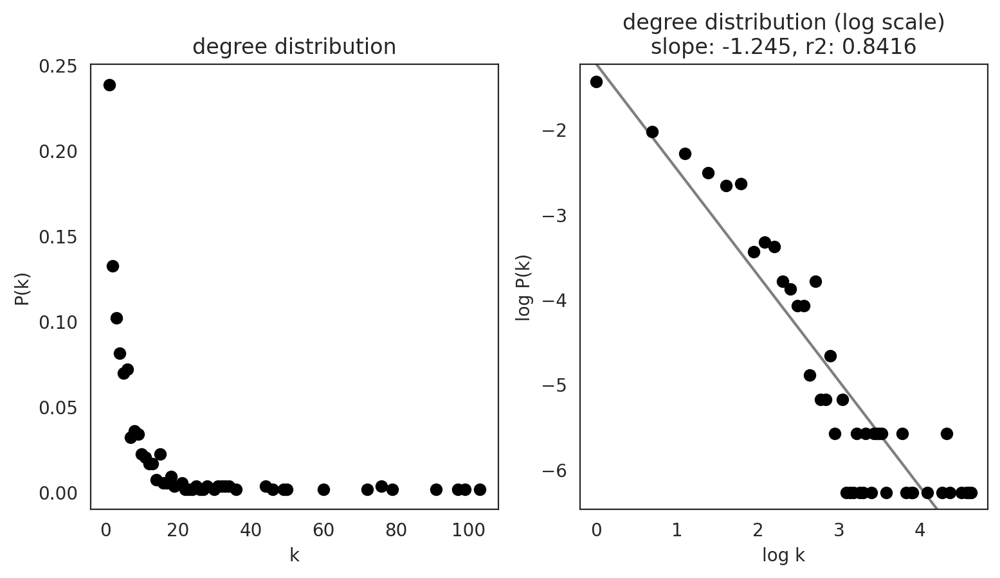

DP


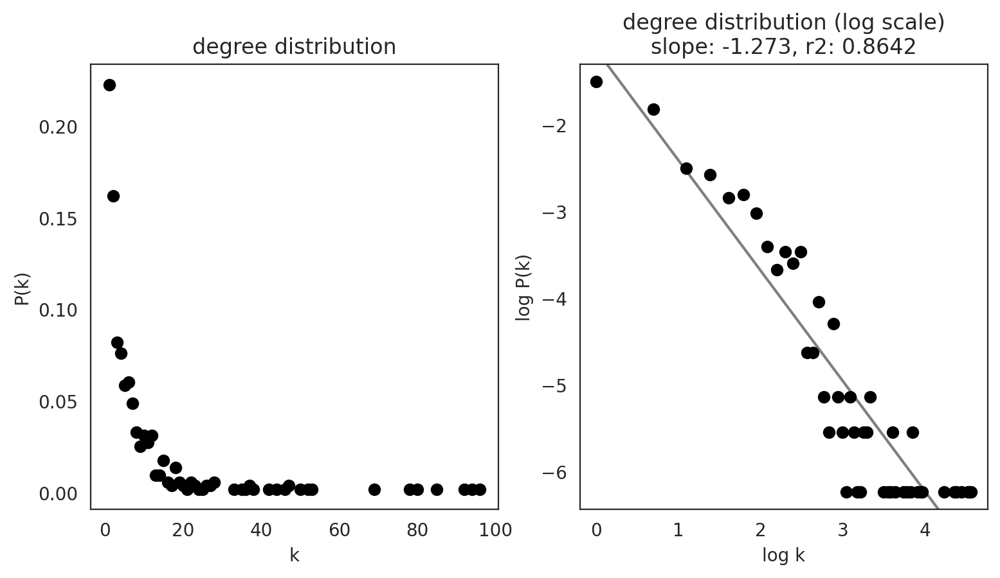

DS


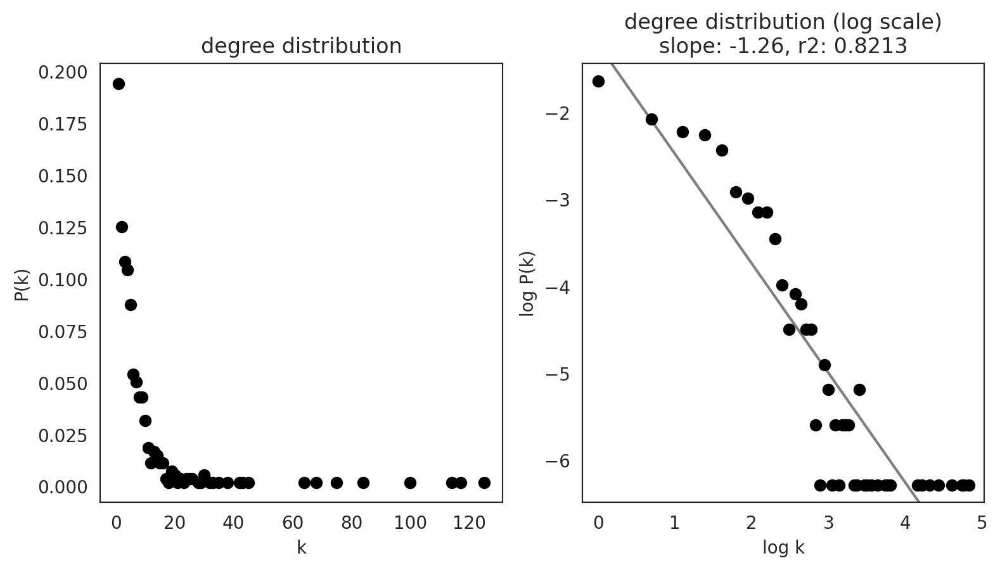

FIB-1


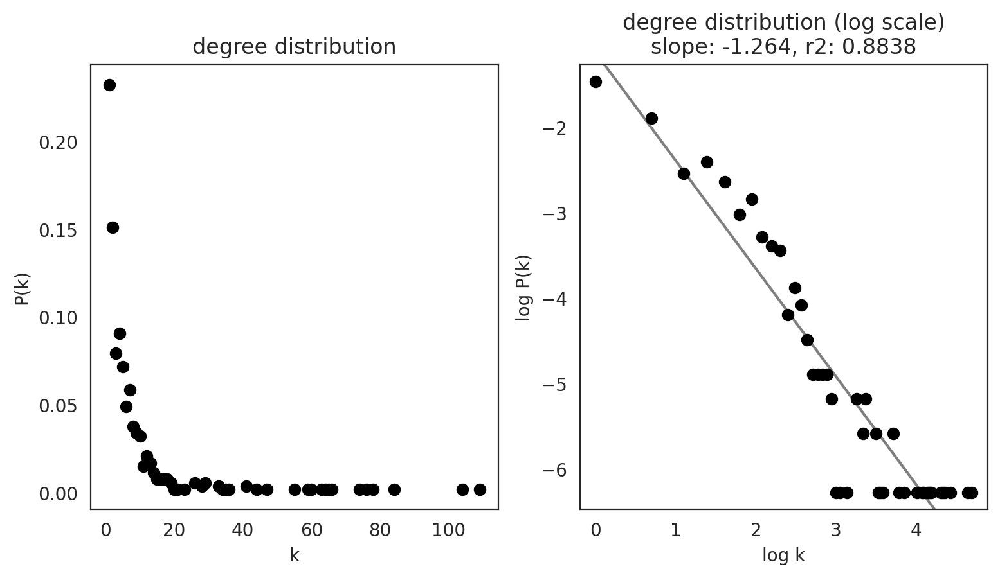

FIB-2


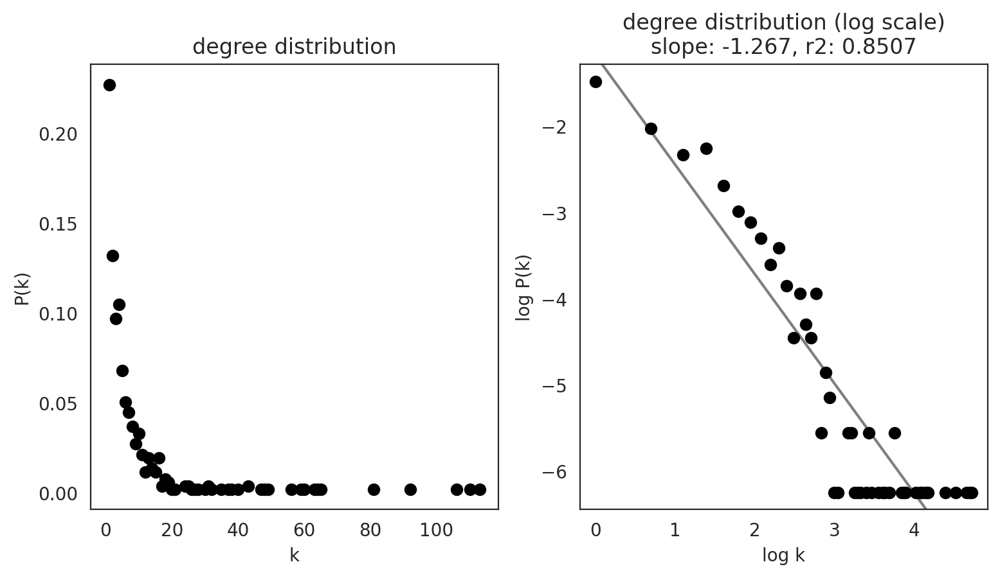

FIB-3


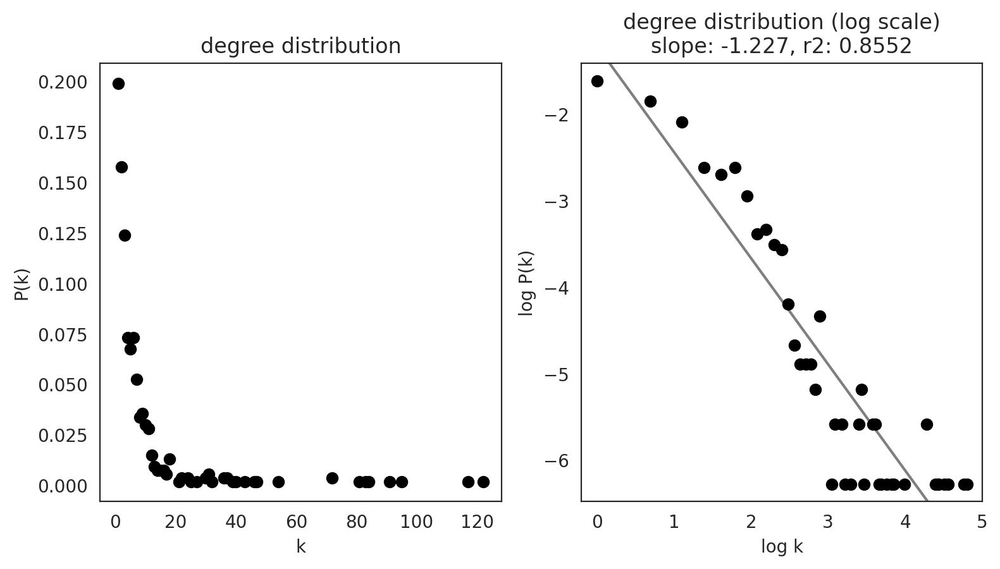

FIB-4


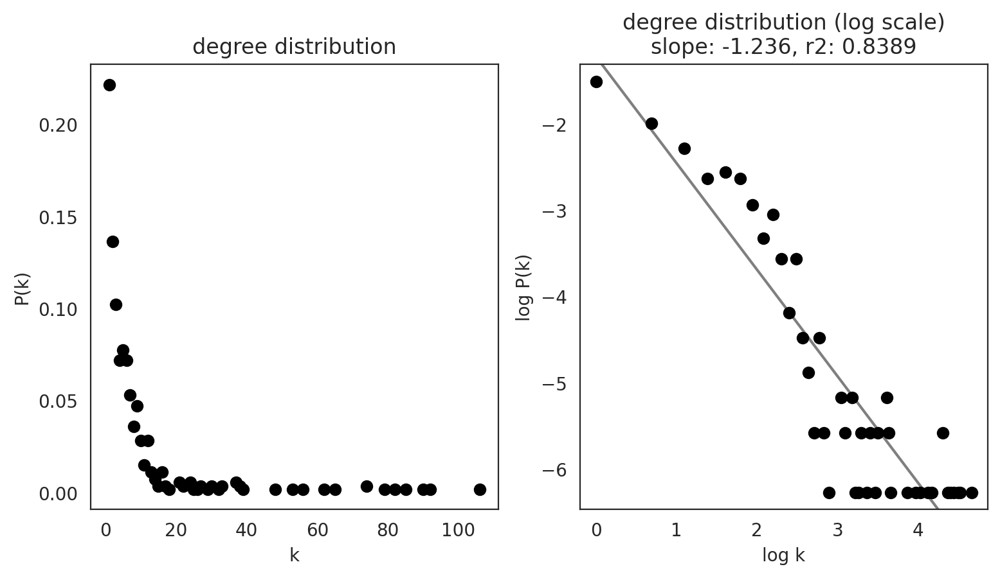

Pre-adipo


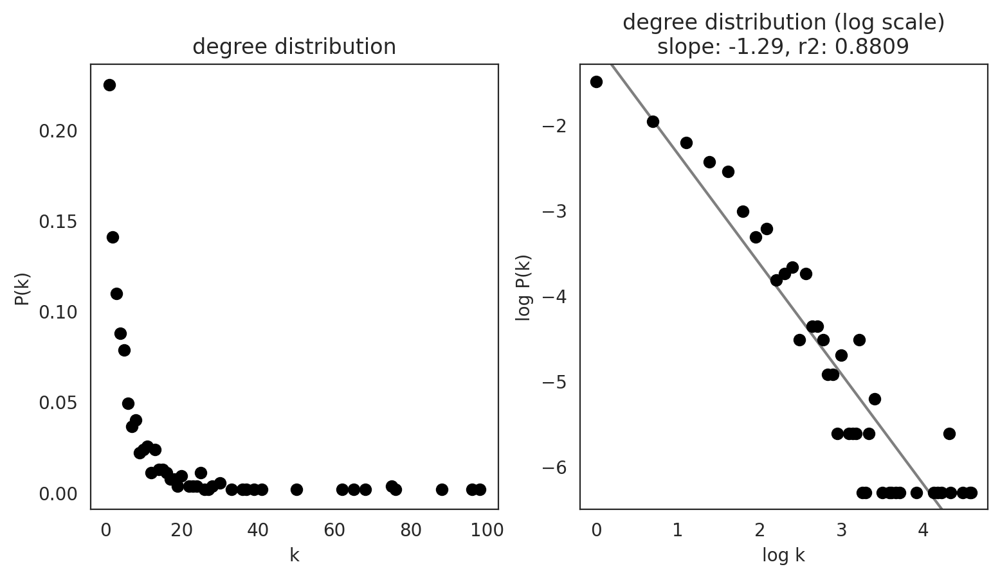

emFIB-1


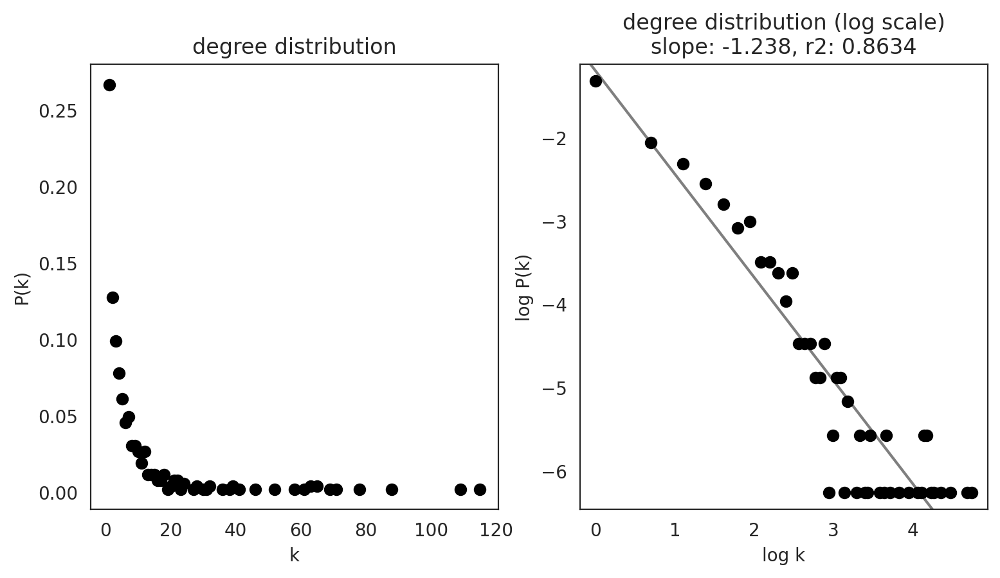

emFIB-2


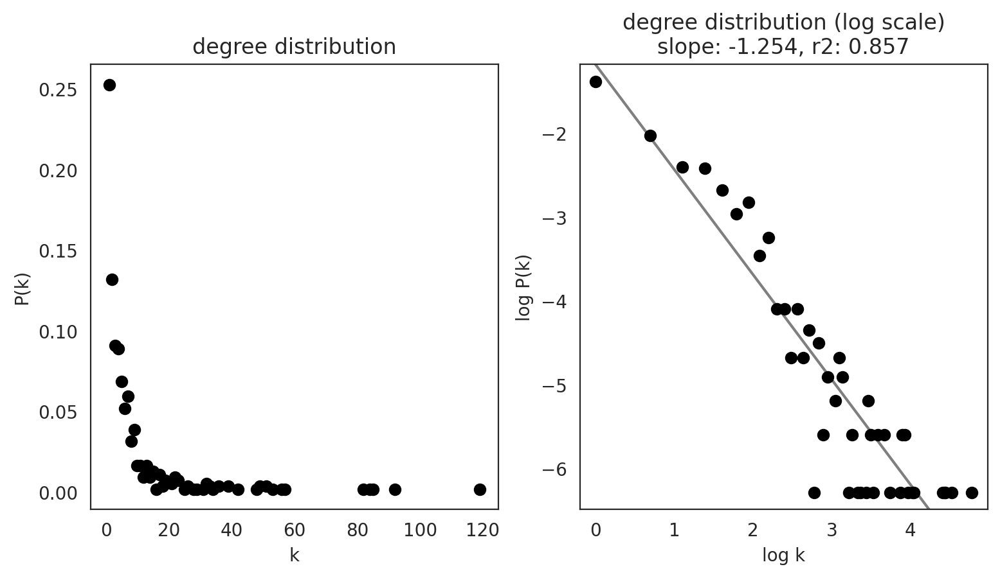

In [91]:
links.plot_degree_distributions(plot_model=True,
                                               #save=f"{save_folder}/degree_distribution/",
                                               )

In [92]:
# Calculate network scores.
links.get_network_score()

In [93]:
links.merged_score.head()

,degree_all,degree_centrality_all,degree_in,degree_centrality_in,degree_out,degree_centrality_out,betweenness_centrality,eigenvector_centrality,cluster
Zeb1,129,0.268191,0,0.000000,129,0.268191,0.0,1.000000,APM
Pde4d,5,0.010395,5,0.010395,0,0.000000,0.0,0.248667,APM
Plagl1,98,0.203742,3,0.006237,95,0.197505,1880.0,0.786584,APM
Id2,42,0.087318,6,0.012474,36,0.074844,1111.0,0.366852,APM
Lum,21,0.043659,21,0.043659,0,0.000000,0.0,0.393927,APM


In [94]:
links.merged_score

,degree_all,degree_centrality_all,degree_in,degree_centrality_in,degree_out,degree_centrality_out,betweenness_centrality,eigenvector_centrality,cluster
Zeb1,129,0.268191,0,0.000000,129,0.268191,0.0,1.000000,APM
Pde4d,5,0.010395,5,0.010395,0,0.000000,0.0,0.248667,APM
Plagl1,98,0.203742,3,0.006237,95,0.197505,1880.0,0.786584,APM
Id2,42,0.087318,6,0.012474,36,0.074844,1111.0,0.366852,APM
Lum,21,0.043659,21,0.043659,0,0.000000,0.0,0.393927,APM
...,...,...,...,...,...,...,...,...,...
Ccbe1,1,0.001862,1,0.001862,0,0.000000,0.0,0.027873,emFIB-2
Klhl13,1,0.001862,1,0.001862,0,0.000000,0.0,0.021812,emFIB-2
Spon1,1,0.001862,1,0.001862,0,0.000000,0.0,0.005513,emFIB-2
Lxn,1,0.001862,1,0.001862,0,0.000000,0.0,0.027799,emFIB-2


In [95]:
oracle

Oracle object

Meta data
    celloracle version used for instantiation: 0.18.0
    n_cells: 34103
    n_genes: 3000
    cluster_name: label
    dimensional_reduction_name: X_draw_graph_fa
    n_target_genes_in_TFdict: 17919 genes
    n_regulatory_in_TFdict: 1090 genes
    n_regulatory_in_both_TFdict_and_scRNA-seq: 169 genes
    n_target_genes_both_TFdict_and_scRNA-seq: 2599 genes
    k_for_knn_imputation: 852
Status
    Gene expression matrix: Ready
    BaseGRN: Ready
    PCA calculation: Done
    Knn imputation: Done
    GRN calculation for simulation: Not finished

In [96]:
links

In [97]:
# Check cluster name
links.cluster

['APM',
 'Chond-Fib',
 'Coch-Fib',
 'DC/DP',
 'DP',
 'DS',
 'FIB-1',
 'FIB-2',
 'FIB-3',
 'FIB-4',
 'Pre-adipo',
 'emFIB-1',
 'emFIB-2']

In [98]:
links.palette

,palette
APM,#FF4A46
Chond-Fib,#008941
Coch-Fib,#006FA6
DC/DP,#A30059
DP,#FF34FF
DS,#7A4900
FIB-1,#0000A6
FIB-2,#63FFAC
FIB-3,#B79762
FIB-4,#004D43


In [100]:
oracle.get_cluster_specific_TFdict_from_Links(links_object=links)
oracle.fit_GRN_for_simulation(alpha=10, use_cluster_specific_TFdict=True)

  0%|          | 0/13 [00:00<?, ?it/s]

In [101]:
oracle

Oracle object

Meta data
    celloracle version used for instantiation: 0.18.0
    n_cells: 34103
    n_genes: 3000
    cluster_name: label
    dimensional_reduction_name: X_draw_graph_fa
    n_target_genes_in_TFdict: 17919 genes
    n_regulatory_in_TFdict: 1090 genes
    n_regulatory_in_both_TFdict_and_scRNA-seq: 169 genes
    n_target_genes_both_TFdict_and_scRNA-seq: 2599 genes
    k_for_knn_imputation: 852
Status
    Gene expression matrix: Ready
    BaseGRN: Ready
    PCA calculation: Done
    Knn imputation: Done
    GRN calculation for simulation: Done

In [102]:
oracle.simulate_shift(perturb_condition={'Mef2c': 0.0}, n_propagation=3)

In [103]:
oracle.estimate_transition_prob(n_neighbors=200,
                                knn_random=True,
                                sampled_fraction=1)

oracle.calculate_embedding_shift(sigma_corr=0.05)

In [104]:
goi = "Mef2c"

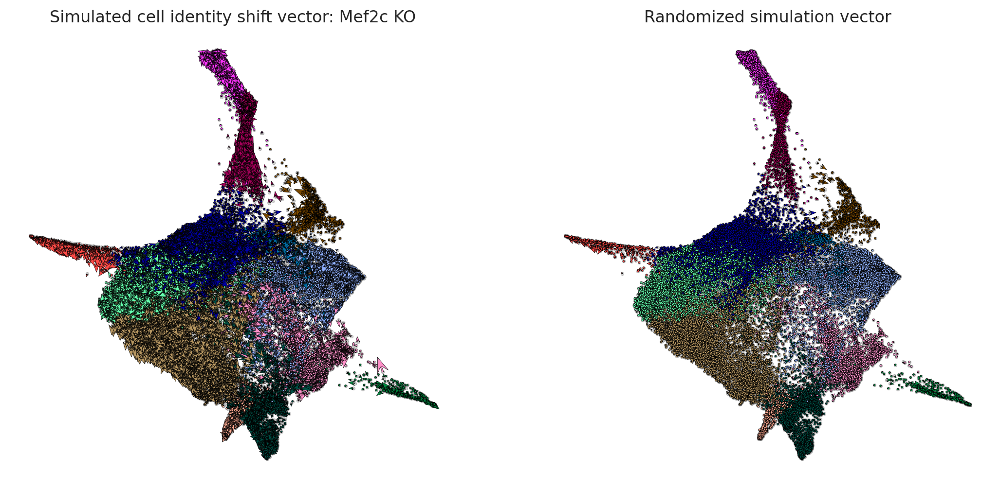

In [105]:
fig, ax = plt.subplots(1, 2,  figsize=[13, 6])

scale = 50
# Show quiver plot
oracle.plot_quiver(scale=scale, ax=ax[0])
ax[0].set_title(f"Simulated cell identity shift vector: {goi} KO")

# Show quiver plot that was calculated with randomized graph.
oracle.plot_quiver_random(scale=scale, ax=ax[1])
ax[1].set_title(f"Randomized simulation vector")

plt.show()

In [106]:
# n_grid = 40 is a good starting value.
n_grid = 40
oracle.calculate_p_mass(smooth=0.8, n_grid=n_grid, n_neighbors=200)

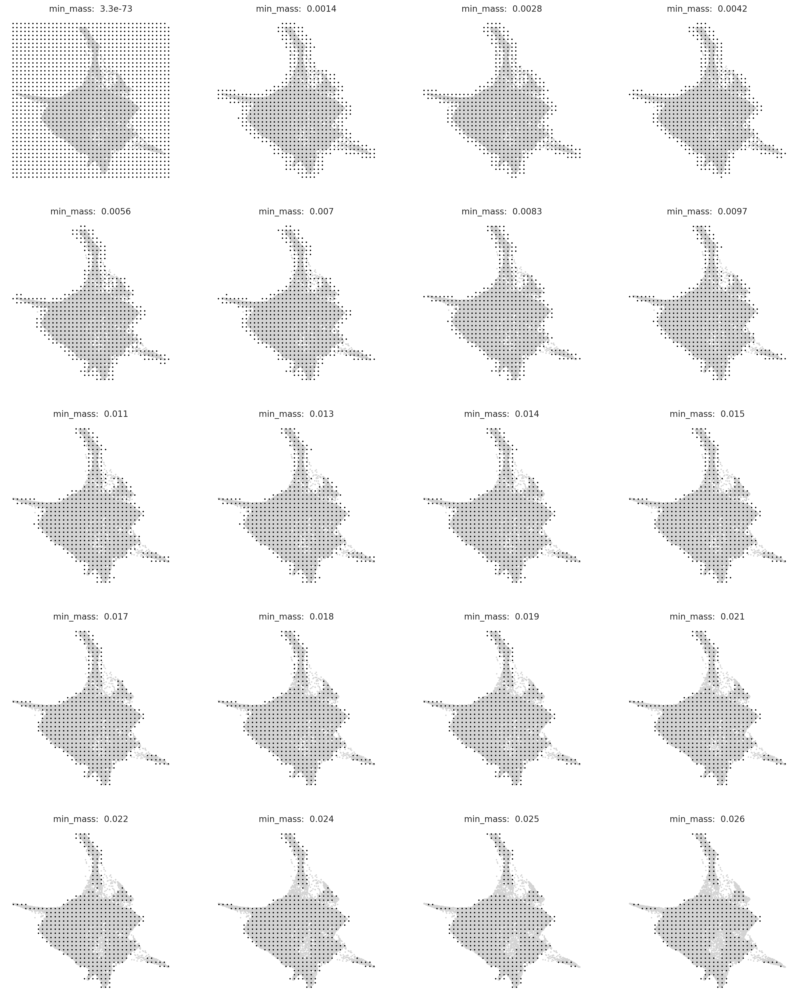

In [107]:
# Search for best min_mass.
oracle.suggest_mass_thresholds(n_suggestion=20)

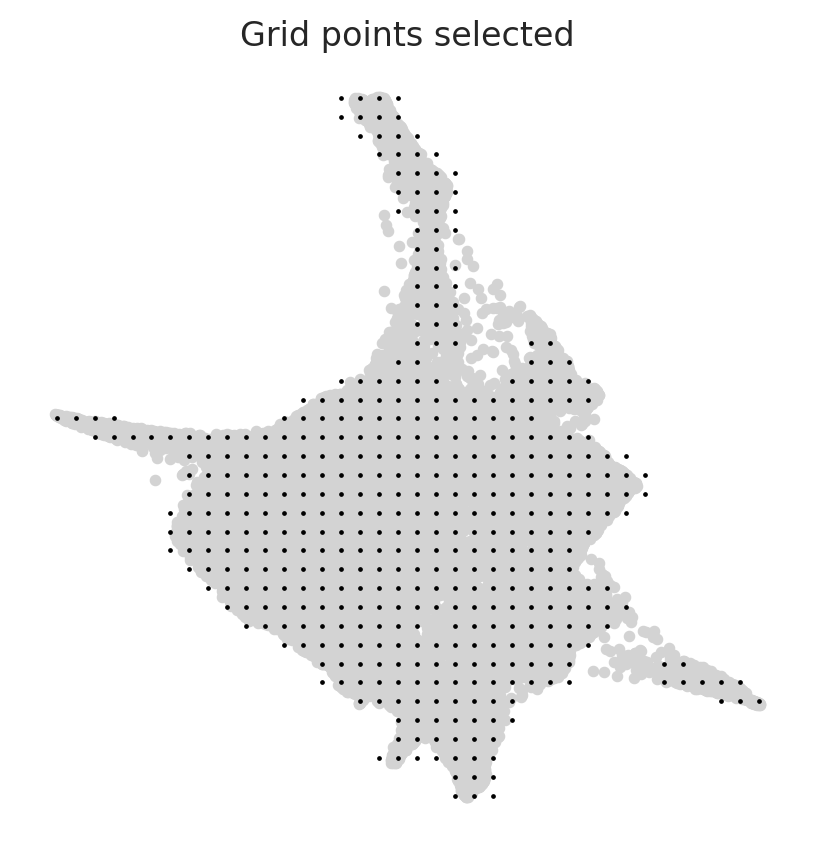

In [108]:
min_mass = 0.02
oracle.calculate_mass_filter(min_mass=min_mass, plot=True)

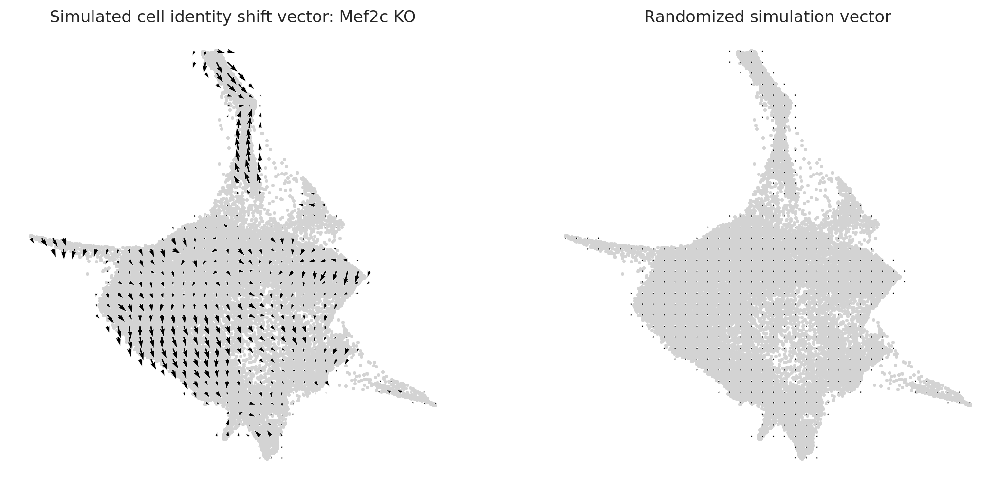

In [109]:
fig, ax = plt.subplots(1, 2,  figsize=[13, 6])

scale_simulation = 0.8
# Show quiver plot
oracle.plot_simulation_flow_on_grid(scale=scale_simulation, ax=ax[0])
ax[0].set_title(f"Simulated cell identity shift vector: {goi} KO")

# Show quiver plot that was calculated with randomized graph.
oracle.plot_simulation_flow_random_on_grid(scale=scale_simulation, ax=ax[1])
ax[1].set_title(f"Randomized simulation vector")

plt.show()

In [110]:
#oracle.to_hdf5("240712.oracle.fibroblast.fullcells.ouratac.fagraph.celloracle.oracle")

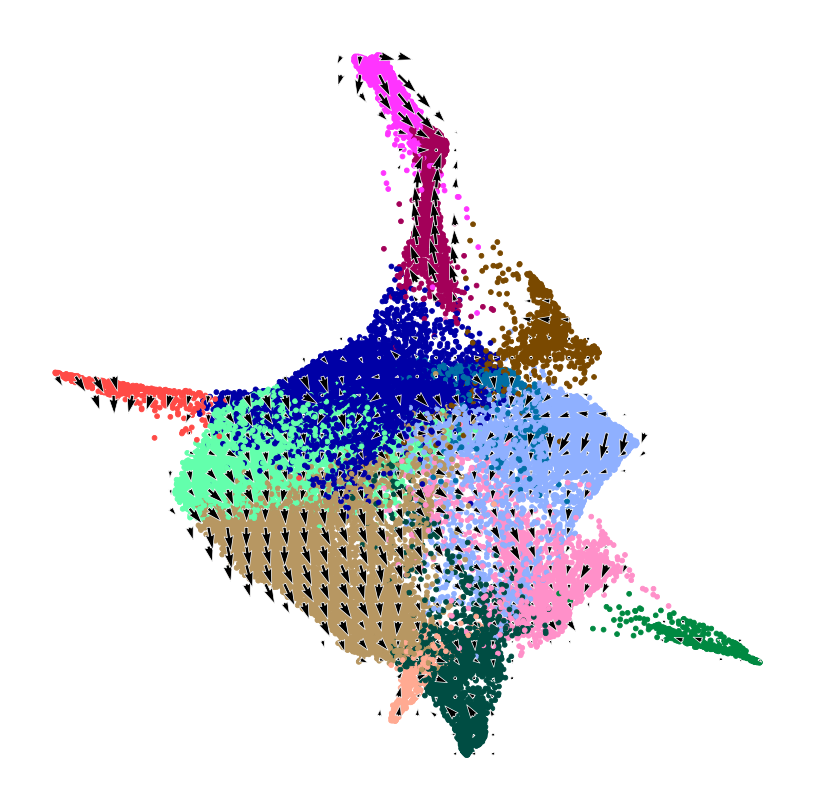

In [126]:
# Plot vector field with cell cluster
fig, ax = plt.subplots(figsize=[5, 5])

oracle.plot_cluster_whole(ax=ax, s=3)
oracle.plot_simulation_flow_on_grid(scale=scale_simulation, ax=ax, show_background=False, ) 
plt.savefig("250219.stimulation.newcolor_umap-2.png", transparent=True)

In [ ]:
#svg image is too heavy for some reason

In [ ]:
oracle.run_markov_chain_simulation(n_steps=200, n_duplication=5)

In [ ]:
# Randomly pick up 3 cells
np.random.seed(12)
cells = oracle.adata.obs.index.values[np.random.choice(oracle.ixs_markvov_simulation, 3)]

# Visualize the simulated results of cell transition after perturbation
for k in cells:
    print(f"cell {k}")
    plt.figure(figsize=[9, 3])
    for j, i in enumerate([0, 20, 50]): # time points
        plt.subplot(1, 3, (j+1))
        oracle.plot_mc_results_as_trajectory(k, range(0, i))
        plt.title(f"simulation step: 0~{i}")
        plt.axis("off")
    plt.show()

In [ ]:
oracle.plot_mc_results_as_kde(50)

In [ ]:
oracle.plot_mc_results_as_kde(200)

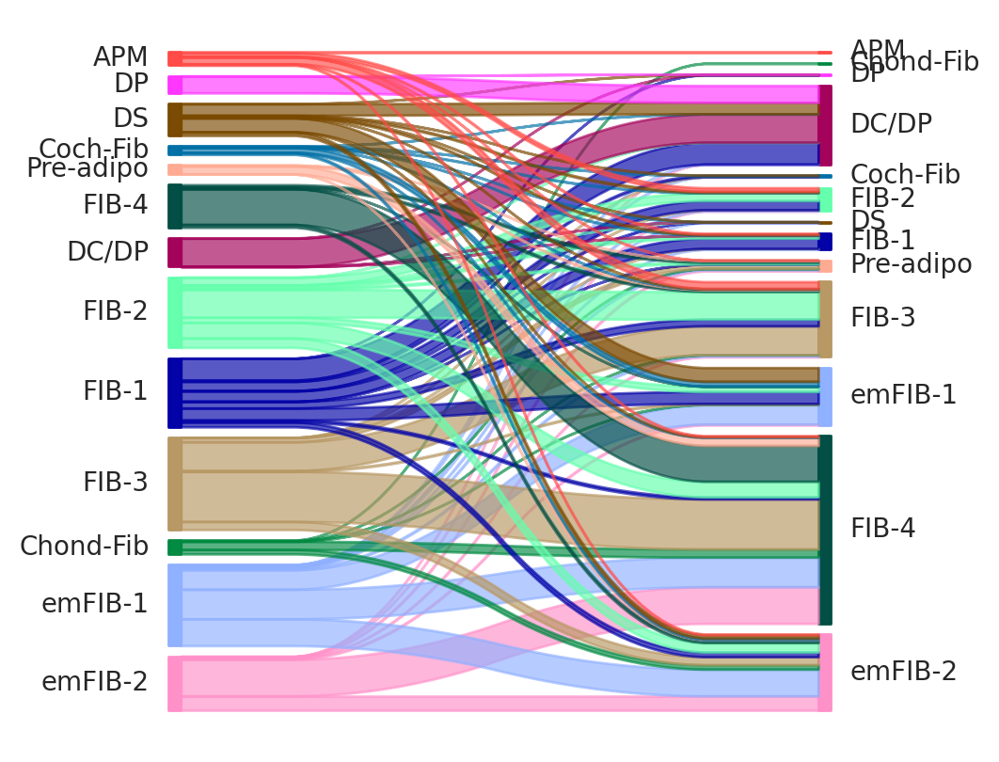

In [116]:
plt.figure(figsize=[5,5])
oracle.plot_mc_results_as_sankey(cluster_use='label')

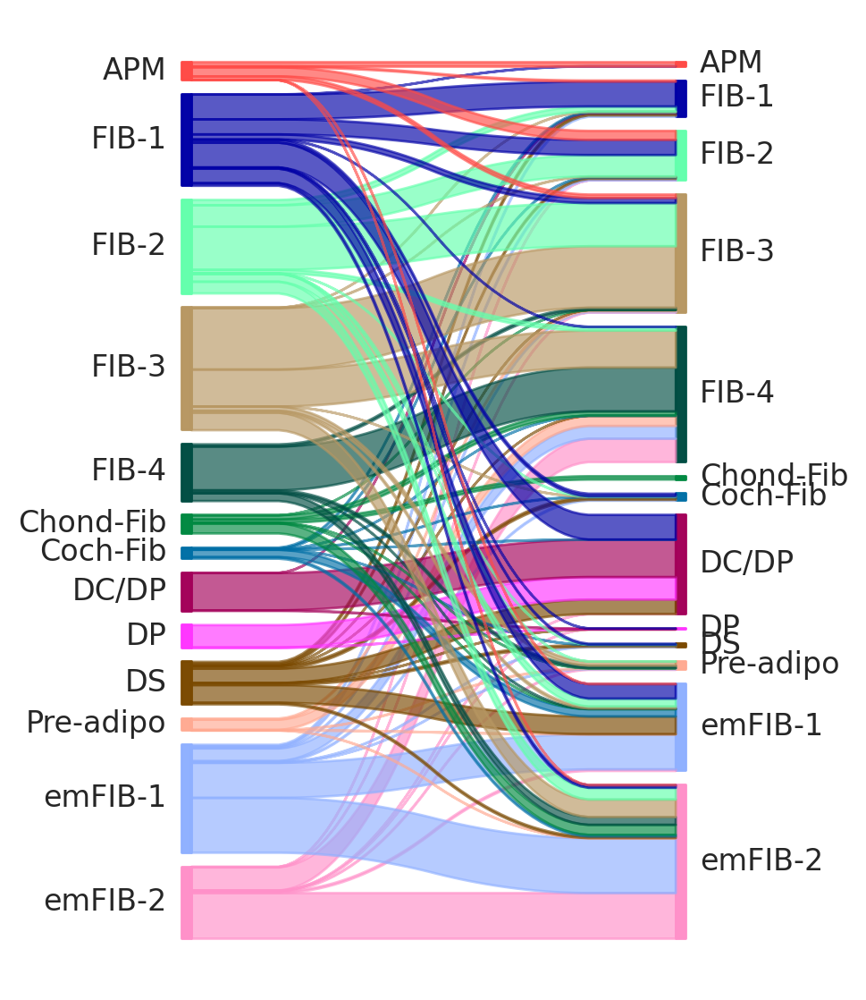

In [120]:
order = ['APM', 'FIB-1', 'FIB-2', 'FIB-3', 'FIB-4', 'Chond-Fib', 'Coch-Fib', 'DC/DP', 'DP', 'DS', 'Pre-adipo', 'emFIB-1', 'emFIB-2']
cl = "label"

plt.figure(figsize=[4,7])
oracle.plot_mc_results_as_sankey(cluster_use=cl, start=0, end=100, order=order, font_size=12)
plt.savefig("250219.perturbation.stimulationplot.svg", transparent=False)